<a href="https://colab.research.google.com/github/nivla0607/CS114.L22.KHCL/blob/main/Hand_writting_digit_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Thành viên nhóm**


1.   Phạm Minh Khôi
2.   Phạm Quốc Đạt
3.   Nguyễn Phạm Vĩnh Nguyên



# Import Libraries

In [1]:
print(__doc__)

# Author: Gael Varoquaux <gael dot varoquaux at normalesup dot org>
# License: BSD 3 clause

# Standard scientific Python imports
import matplotlib.pyplot as plt

# Import datasets, classifiers and performance metrics
from sklearn import datasets, svm, metrics
from sklearn.model_selection import train_test_split
import cv2 
import os
import numpy as np

from google.colab import drive
from google.colab.patches import cv2_imshow

from sklearn.metrics import accuracy_score

Automatically created module for IPython interactive environment


In [11]:
drive.mount('/gdrive')

Mounted at /gdrive


# Loading and visualizing data

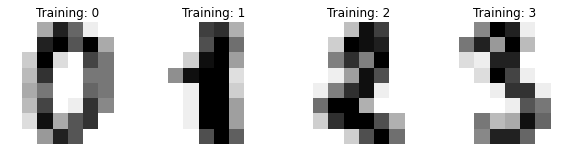

In [2]:
digits = datasets.load_digits()

_, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 3))
for ax, image, label in zip(axes, digits.images, digits.target):
    ax.set_axis_off()
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
    ax.set_title('Training: %i' % label)

# Classification

In [4]:
# flatten the images
n_samples = len(digits.images)
data = digits.images.reshape((n_samples, -1))

# Create a classifier: a support vector classifier
clf = svm.SVC(gamma=0.001)

# Split data into 50% train and 50% test subsets
X_train, X_test, y_train, y_test = train_test_split(
    data, digits.target, test_size=0.5, shuffle=False)

# Learn the digits on the train subset
clf.fit(X_train, y_train)

# Predict the value of the digit on the test subset
predicted = clf.predict(X_test)

# Prediction

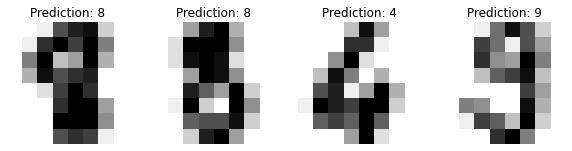

In [5]:
_, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 3))
for ax, image, prediction in zip(axes, X_test, predicted):
    ax.set_axis_off()
    image = image.reshape(8, 8)
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
    ax.set_title(f'Prediction: {prediction}')

# Classification report

In [6]:
print(f"Classification report for classifier {clf}:\n"
      f"{metrics.classification_report(y_test, predicted)}\n")

Classification report for classifier SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        88
           1       0.99      0.97      0.98        91
           2       0.99      0.99      0.99        86
           3       0.98      0.87      0.92        91
           4       0.99      0.96      0.97        92
           5       0.95      0.97      0.96        91
           6       0.99      0.99      0.99        91
           7       0.96      0.99      0.97        89
           8       0.94      1.00      0.97        88
           9       0.93      0.98      0.95        92

    accuracy                           0.97       899
   macro avg       0.97      0.97      0.97       899
weighted a

# Confusion Matrix

Confusion matrix:
[[87  0  0  0  1  0  0  0  0  0]
 [ 0 88  1  0  0  0  0  0  1  1]
 [ 0  0 85  1  0  0  0  0  0  0]
 [ 0  0  0 79  0  3  0  4  5  0]
 [ 0  0  0  0 88  0  0  0  0  4]
 [ 0  0  0  0  0 88  1  0  0  2]
 [ 0  1  0  0  0  0 90  0  0  0]
 [ 0  0  0  0  0  1  0 88  0  0]
 [ 0  0  0  0  0  0  0  0 88  0]
 [ 0  0  0  1  0  1  0  0  0 90]]


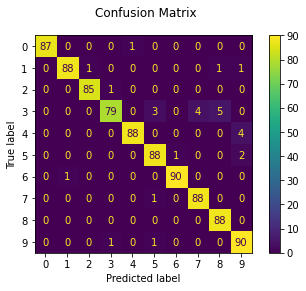

In [7]:
disp = metrics.plot_confusion_matrix(clf, X_test, y_test)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

# Add webcam

In [8]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

# Preprocessing

In [9]:
def PreprocessingImage (_image):
    # TOP, BOT, LEFT, RIGHT ĐANG LÀ TỌA ĐỘ CỦA ĐIỂM GIỮA TẤM ẢNH
    # CÁC BIẾN NÀY CẦN TÍNH TOÀN THÀNH CÁC CỰC ĐỘ CỦA CHỮ SỐ TRONG TẤM ẢNH
    top   = _image.shape[0]//2
    bot   = _image.shape[0]//2
    left  = _image.shape[1]//2
    right = _image.shape[1]//2

    # TIỀN XỬ LÝ
    # XỬ LÝ PHẦN SÁNG VÀ TỐI TRONG BỨC ẢNH ĐỂ CẮT ẢNH
    # ẢNH SAU KHI CẮT LÀ MỘT ẢNH CHỨA CHỮ SỐ
    # BIẾN DARK VÀ BRIGHT TÙY VÀO BỨC ẢNH CÓ THỂ CHỈNH SỬA CHO PHÙ HỢP, NGƯỜI CODE CHƯA BIẾT CÁCH CHỈNH BẰNG CODE NÊN ĐÀNH CHỈNH BẰNG TAY
    DARK = 90
    BRIGHT = 120
    strictedImg = _image.copy()
    # TÍNH TOÁN CÁC CỰC ĐỘ CỦA CHỮ SỐ DỰA VÀO PHẦN MÀU DEN
    for xx in range(_image.shape[0]):
        for yy in range(_image.shape[1]):
            if _image[xx][yy] <= DARK:
                if top >= xx: top = xx
                if bot <= xx: bot = xx
                if left >= yy: left = yy
                if right <= yy: right = yy

                strictedImg[xx][yy] = 0
            if _image[xx][yy] > DARK:
                strictedImg[xx][yy]=255
  
    # DỰA VÀO CÁC 
    edge = bot - top
    if right - left > edge:
        edge = right - left
    edge = edge // 2
    midx = ( bot + top ) // 2
    midy = ( left + right ) // 2
    strictedImg = strictedImg[ midx-edge:midx+edge, midy-edge:midy+edge ]
    strictedImg = 255 - strictedImg
    return strictedImg

# Test model

**Thử nghiệm model với ảnh chụp từ webcam**

<IPython.core.display.Javascript object>

Saved to photo.jpg


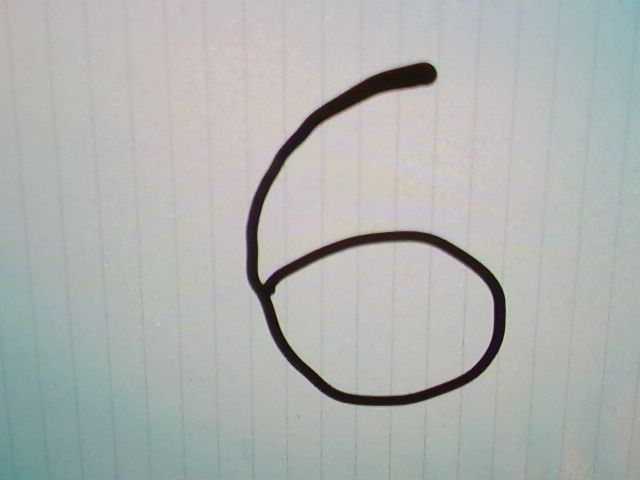

In [ ]:
from IPython.display import Image
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))
  
    # Show the image which was just taken.
    display(Image(filename))
except Exception as err:
    # Errors will be thrown if the user does not have a webcam or if they do not
    # grant the page permission to access it.
    print(str(err))

Ảnh gốc


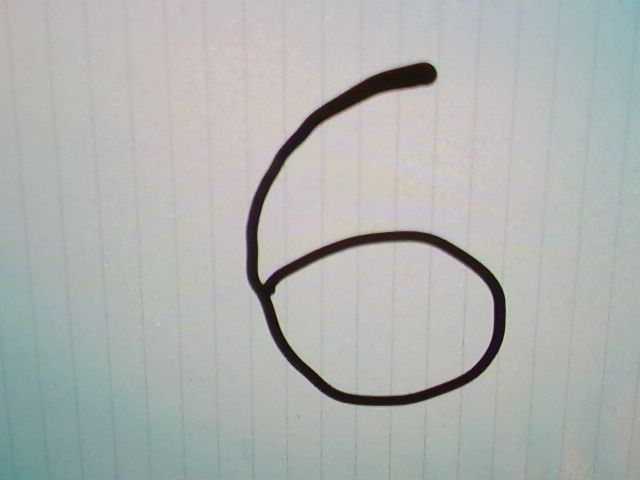

Ảnh sau khi tiền xử lý


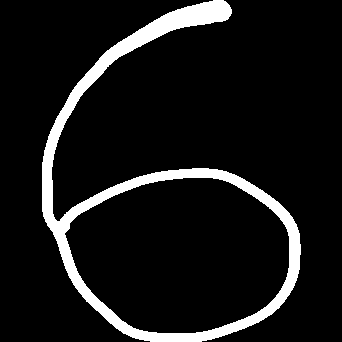

Ảnh đã resize về 8x8


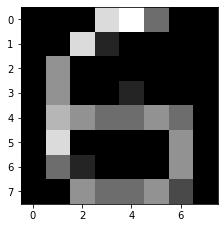

predict :  [3]


In [ ]:
test_image = PreprocessingImage(cv2.imread(filename,0))
test_image1 = test_image // 16
test_image1 = cv2.resize(test_image1,( 8,8 ),interpolation = cv2.INTER_AREA)
_result1 = clf.predict(test_image1.reshape((1,64)))

print('Ảnh gốc')
cv2_imshow(cv2.imread(filename))

print('Ảnh sau khi tiền xử lý')
cv2_imshow(test_image)

print('Ảnh đã resize về 8x8')
plt.figure(figsize=(12,4.5))
plt.subplot(131)
plt.imshow(test_image1, cmap = 'gray', interpolation='nearest')
plt.show()

print('predict : ',_result1)

**Load ảnh từ thư mục ở Drive**

In [ ]:
path_dataset = '/gdrive/MyDrive/CS114.L22.KHCL/Check'
list_fn = os.listdir(path_dataset)
arr_digit = []
for fn in list_fn:
  print(fn)
  arr_digit.append(os.path.join(path_dataset,fn))

**Gán nhãn cho các ảnh ở thư mục trong Drive**

In [13]:
labels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 0, 
          2, 3, 7, 1, 4, 5, 0, 9, 2, 3, 
          4, 9, 1, 4, 6, 0, 0, 4, 2, 5, 
          6, 9, 1, 0, 7, 2, 3, 4, 8, 8, 
          9, 2, 2, 9, 8, 8, 4, 3, 2, 1]

**Thử nghiệm model với ảnh từ thư mục có sẵn**

Ảnh gốc


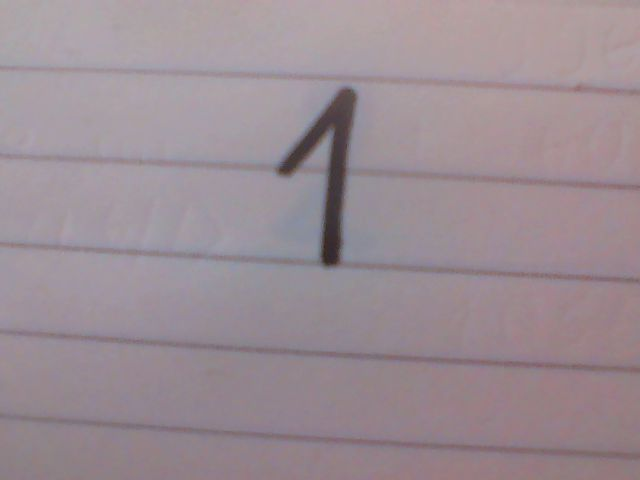

Ảnh sau khi tiền xử lý


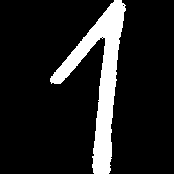

Ảnh đã resize về 8x8


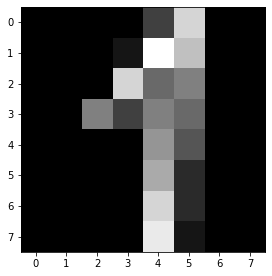

predict :  [1]
Ảnh gốc


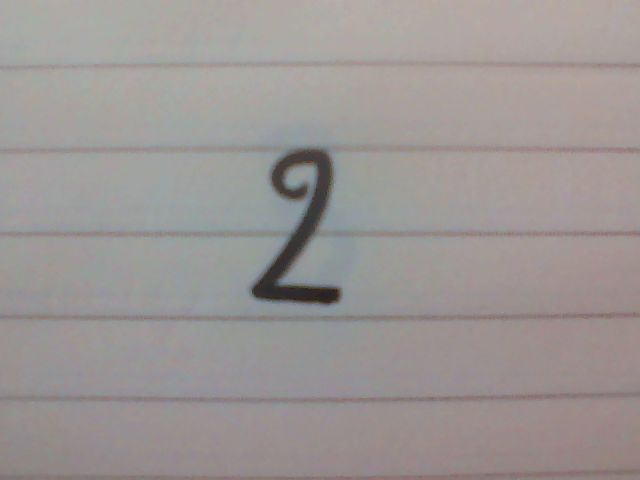

Ảnh sau khi tiền xử lý


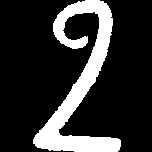

Ảnh đã resize về 8x8


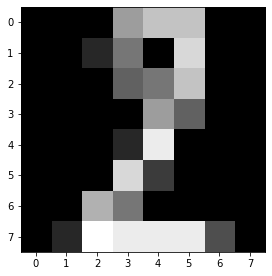

predict :  [2]
Ảnh gốc


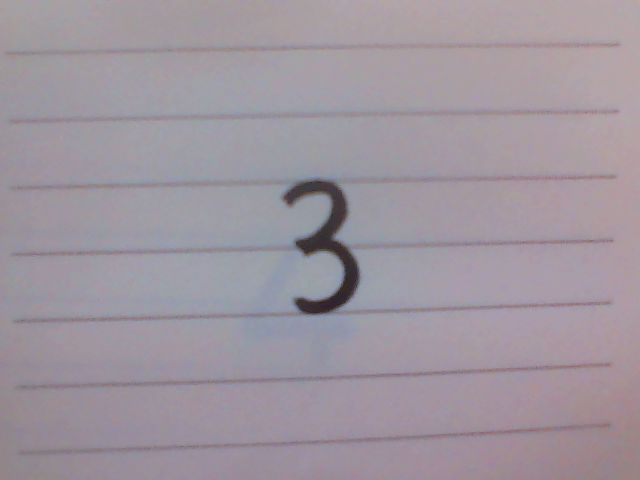

Ảnh sau khi tiền xử lý


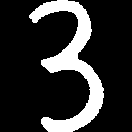

Ảnh đã resize về 8x8


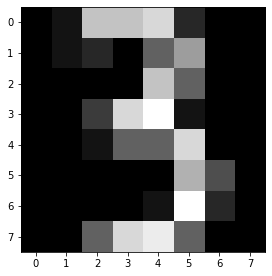

predict :  [3]
Ảnh gốc


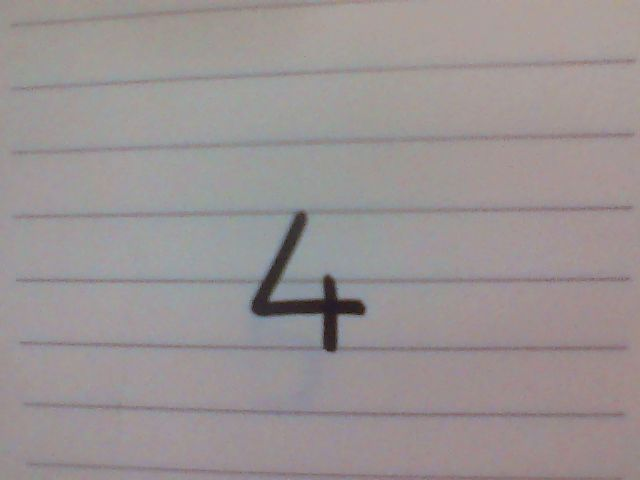

Ảnh sau khi tiền xử lý


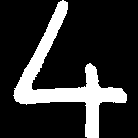

Ảnh đã resize về 8x8


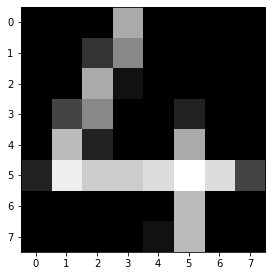

predict :  [4]
Ảnh gốc


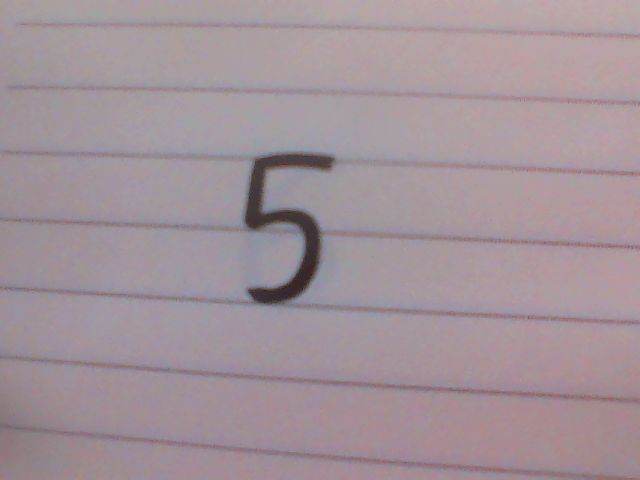

Ảnh sau khi tiền xử lý


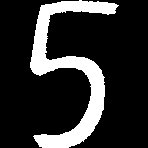

Ảnh đã resize về 8x8


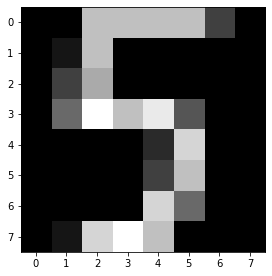

predict :  [5]
Ảnh gốc


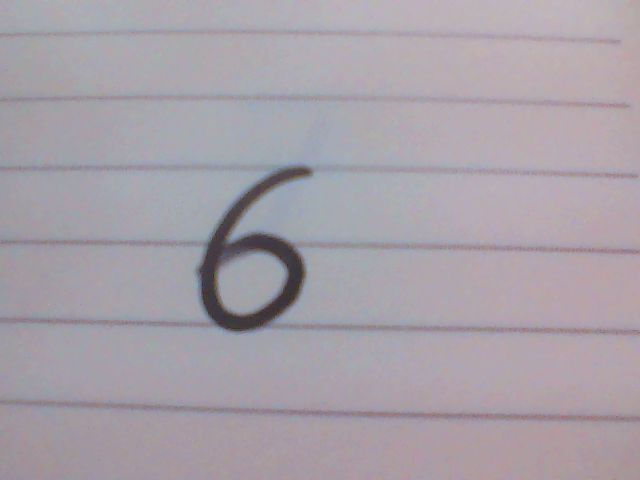

Ảnh sau khi tiền xử lý


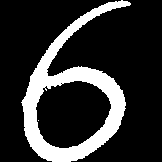

Ảnh đã resize về 8x8


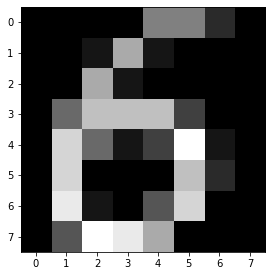

predict :  [5]
Ảnh gốc


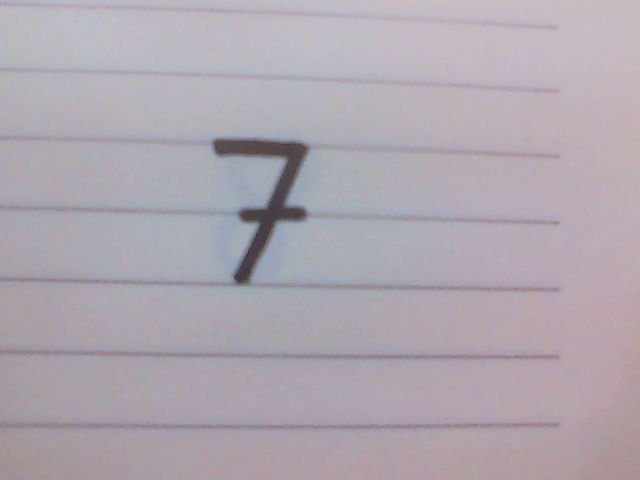

Ảnh sau khi tiền xử lý


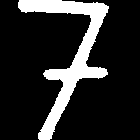

Ảnh đã resize về 8x8


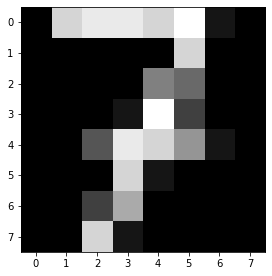

predict :  [7]
Ảnh gốc


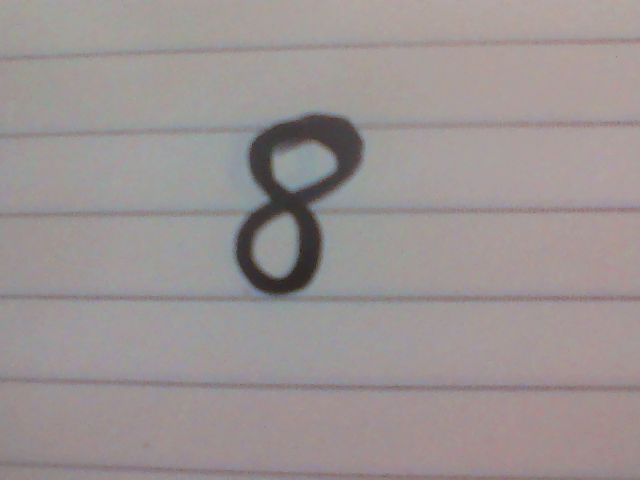

Ảnh sau khi tiền xử lý


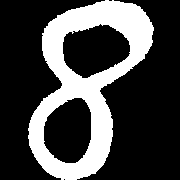

Ảnh đã resize về 8x8


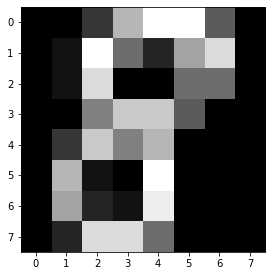

predict :  [5]
Ảnh gốc


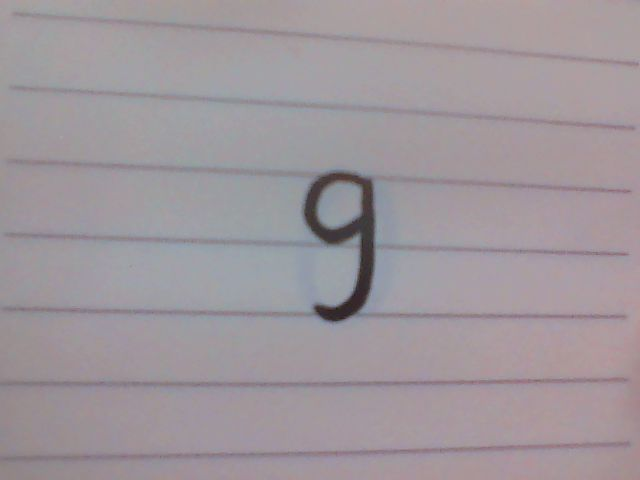

Ảnh sau khi tiền xử lý


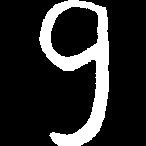

Ảnh đã resize về 8x8


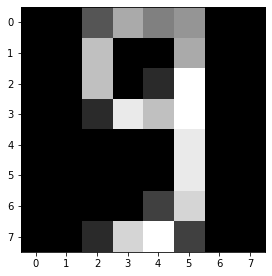

predict :  [9]
Ảnh gốc


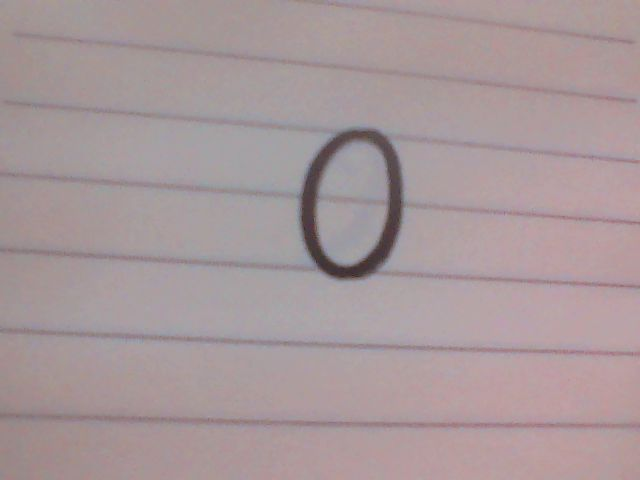

Ảnh sau khi tiền xử lý


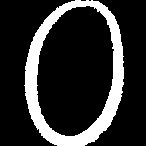

Ảnh đã resize về 8x8


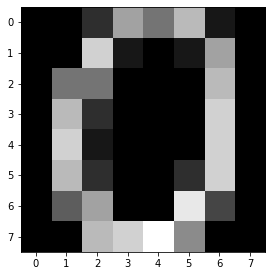

predict :  [5]
Ảnh gốc


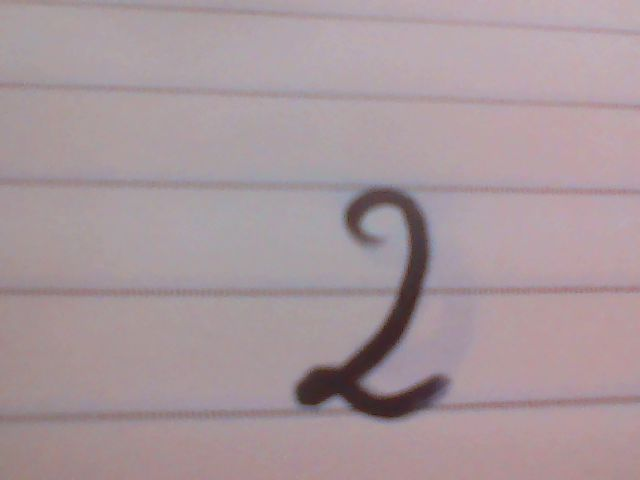

Ảnh sau khi tiền xử lý


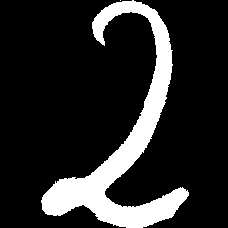

Ảnh đã resize về 8x8


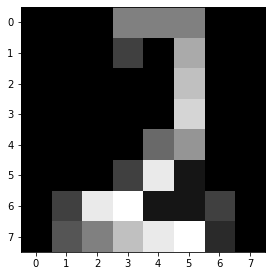

predict :  [2]
Ảnh gốc


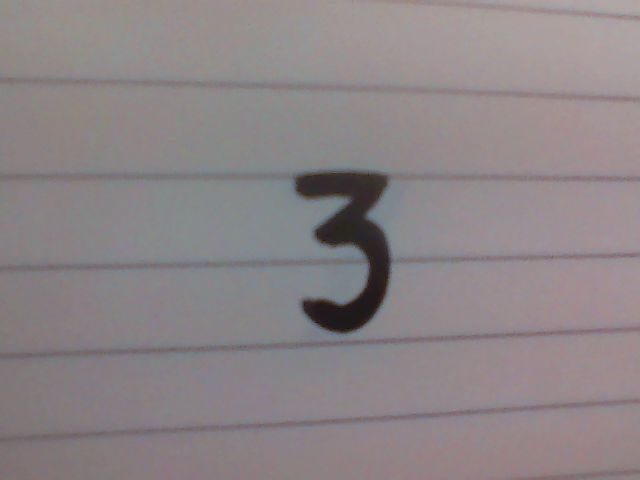

Ảnh sau khi tiền xử lý


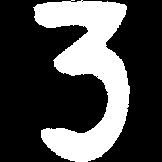

Ảnh đã resize về 8x8


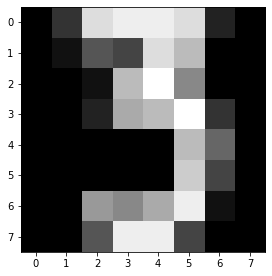

predict :  [3]
Ảnh gốc


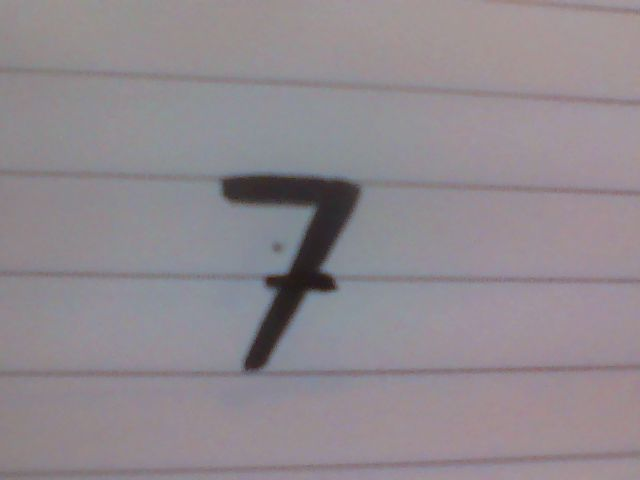

Ảnh sau khi tiền xử lý


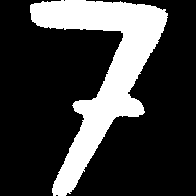

Ảnh đã resize về 8x8


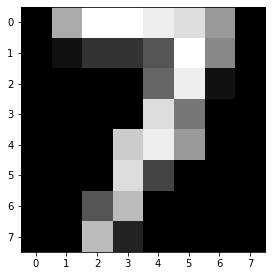

predict :  [7]
Ảnh gốc


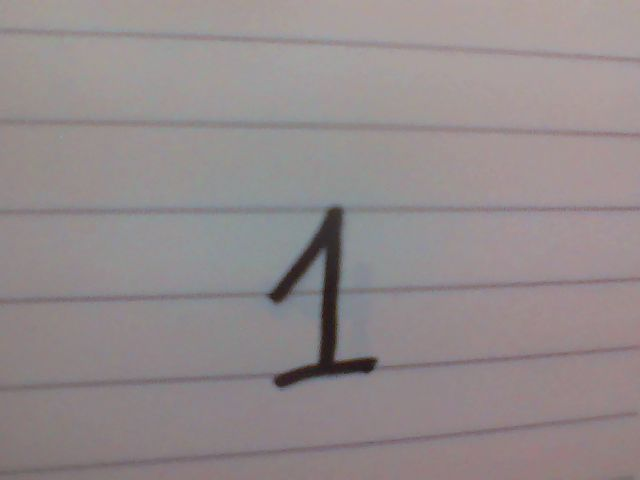

Ảnh sau khi tiền xử lý


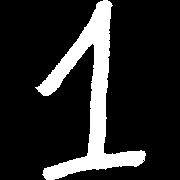

Ảnh đã resize về 8x8


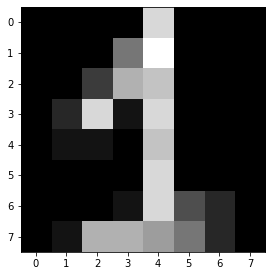

predict :  [1]
Ảnh gốc


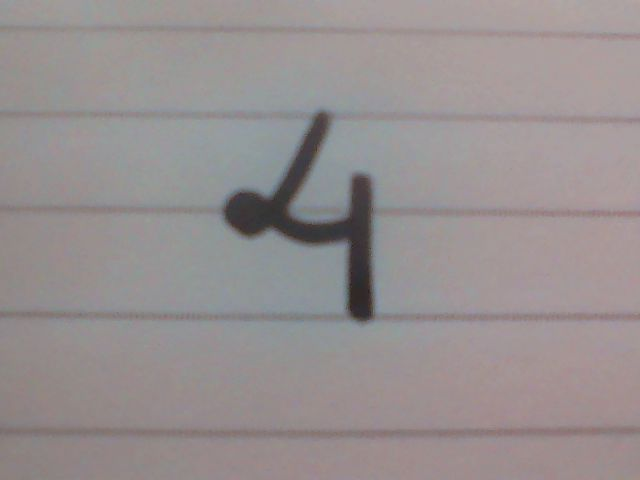

Ảnh sau khi tiền xử lý


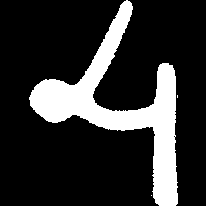

Ảnh đã resize về 8x8


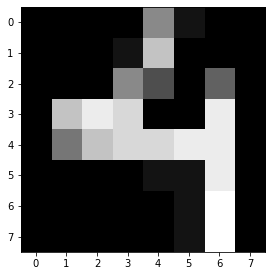

predict :  [9]
Ảnh gốc


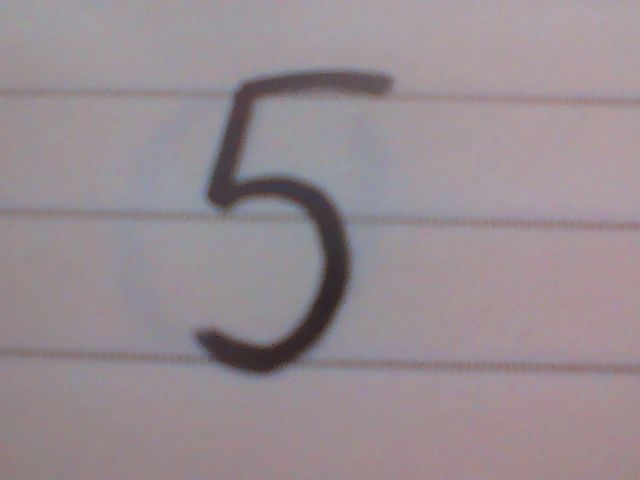

Ảnh sau khi tiền xử lý


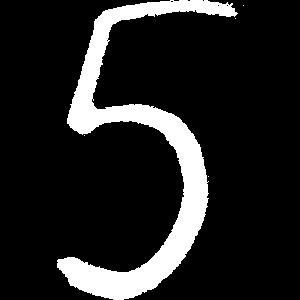

Ảnh đã resize về 8x8


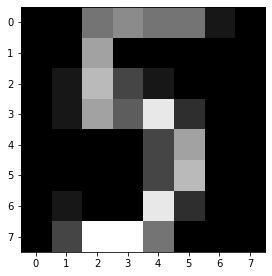

predict :  [5]
Ảnh gốc


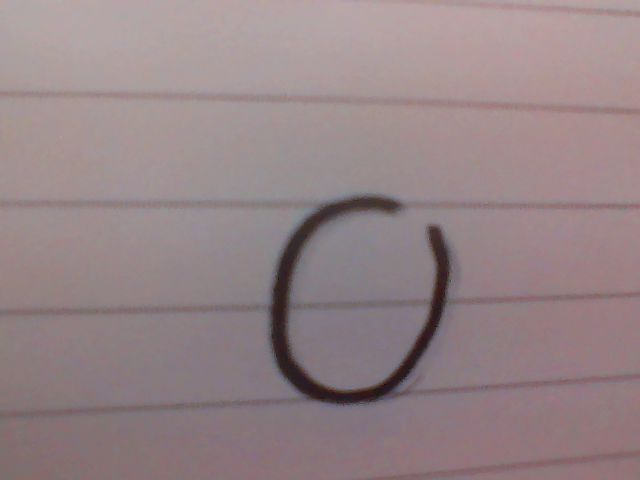

Ảnh sau khi tiền xử lý


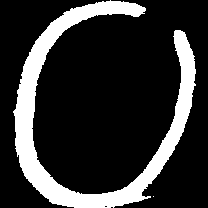

Ảnh đã resize về 8x8


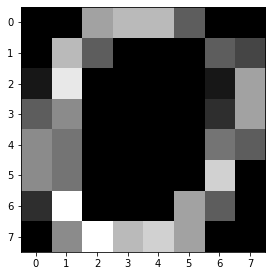

predict :  [5]
Ảnh gốc


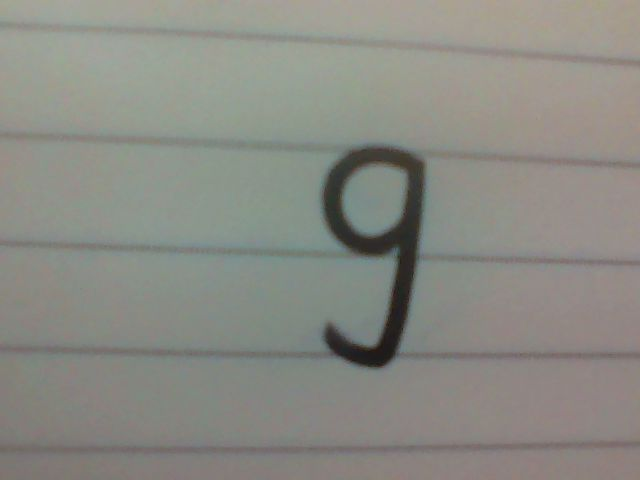

Ảnh sau khi tiền xử lý


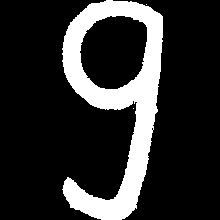

Ảnh đã resize về 8x8


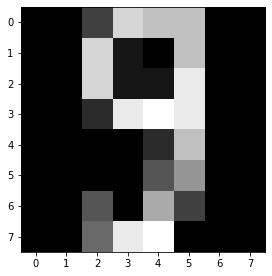

predict :  [9]
Ảnh gốc


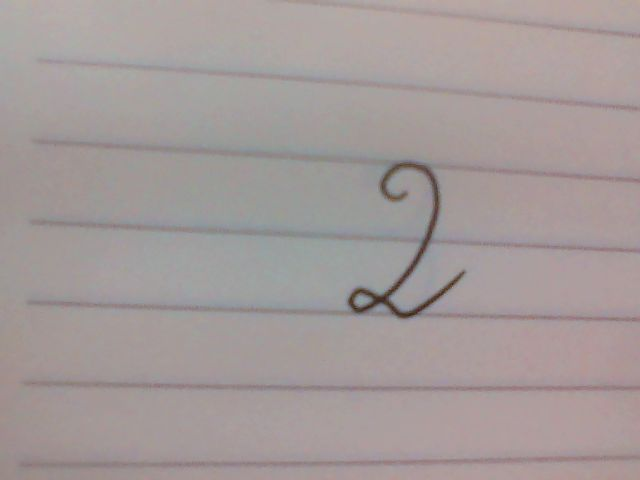

Ảnh sau khi tiền xử lý


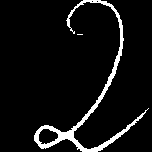

Ảnh đã resize về 8x8


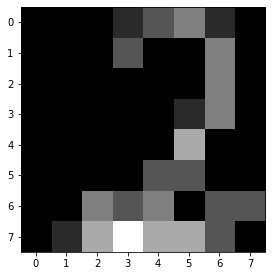

predict :  [7]
Ảnh gốc


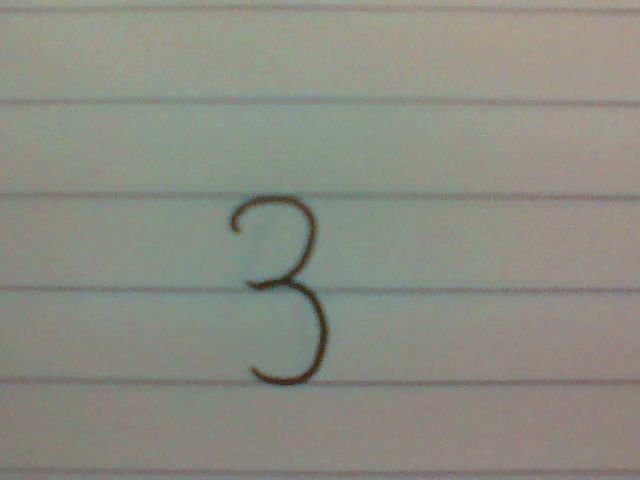

Ảnh sau khi tiền xử lý


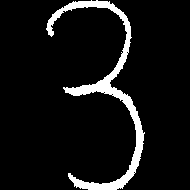

Ảnh đã resize về 8x8


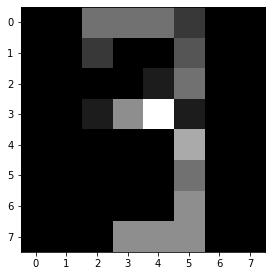

predict :  [9]
Ảnh gốc


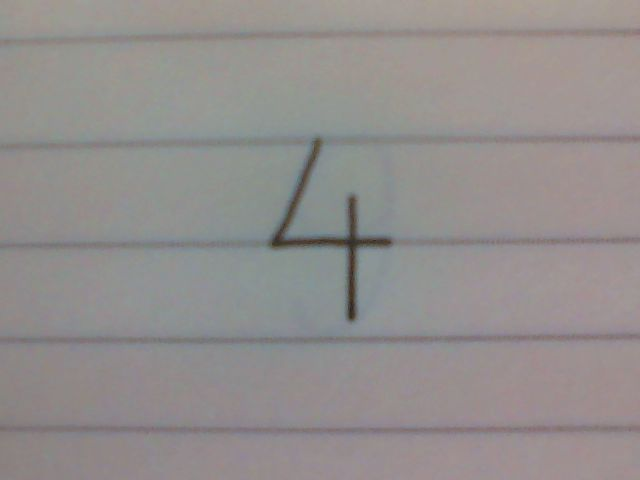

Ảnh sau khi tiền xử lý


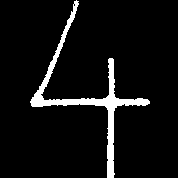

Ảnh đã resize về 8x8


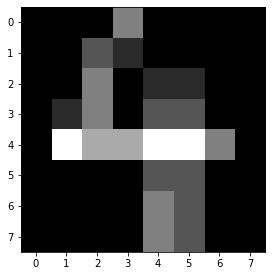

predict :  [9]
Ảnh gốc


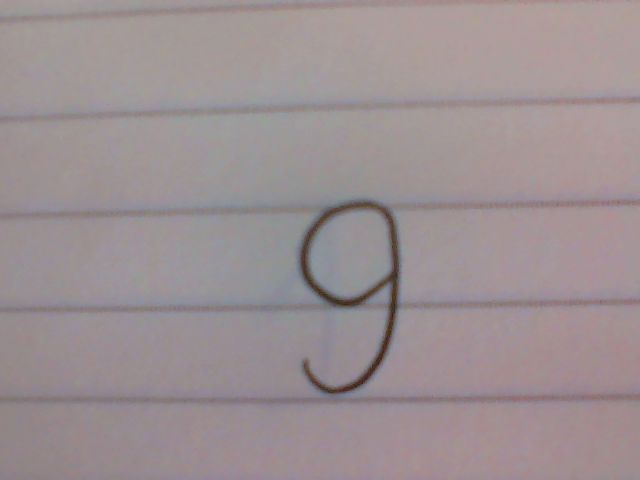

Ảnh sau khi tiền xử lý


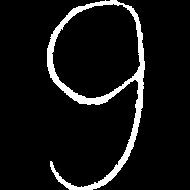

Ảnh đã resize về 8x8


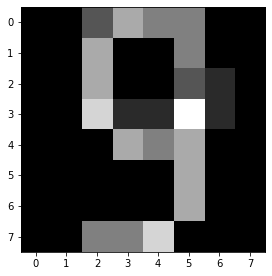

predict :  [9]
Ảnh gốc


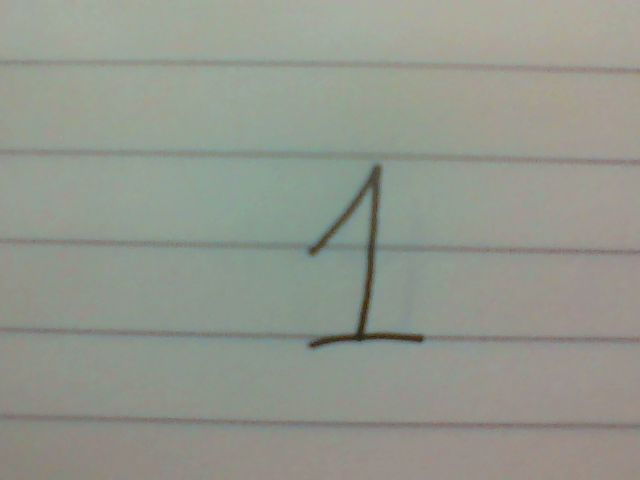

Ảnh sau khi tiền xử lý


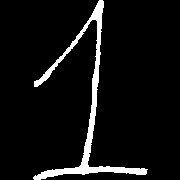

Ảnh đã resize về 8x8


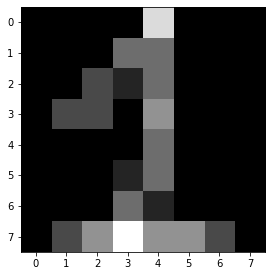

predict :  [2]
Ảnh gốc


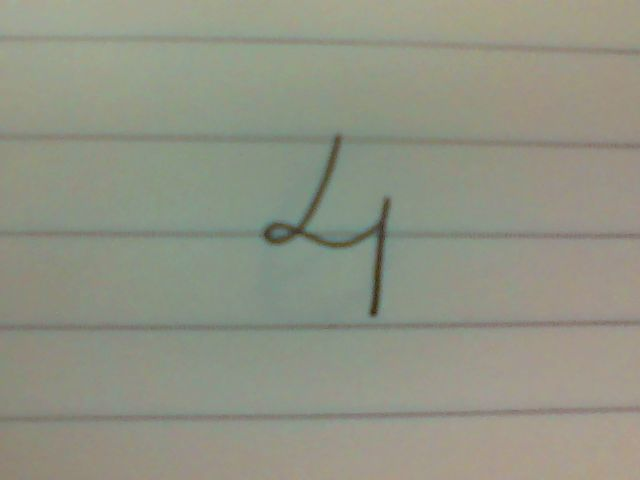

Ảnh sau khi tiền xử lý


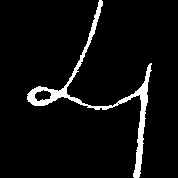

Ảnh đã resize về 8x8


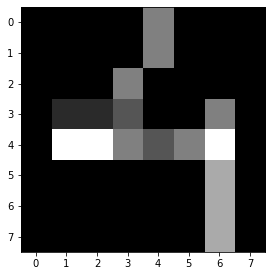

predict :  [9]
Ảnh gốc


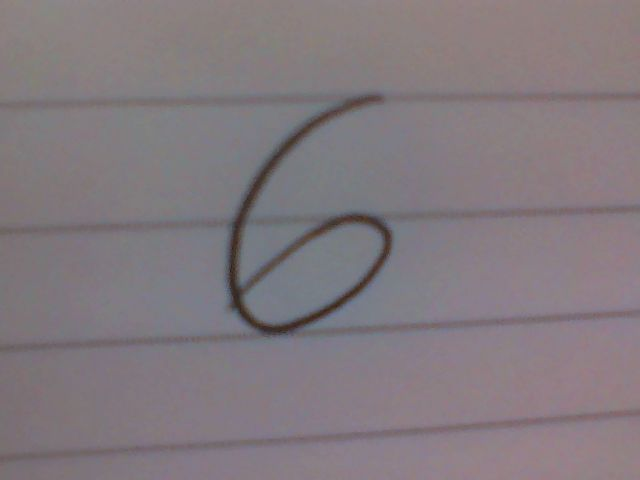

Ảnh sau khi tiền xử lý


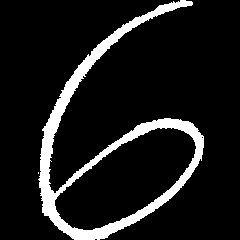

Ảnh đã resize về 8x8


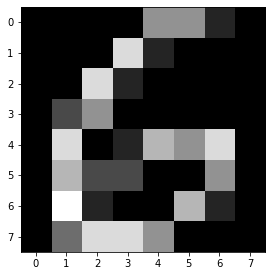

predict :  [5]
Ảnh gốc


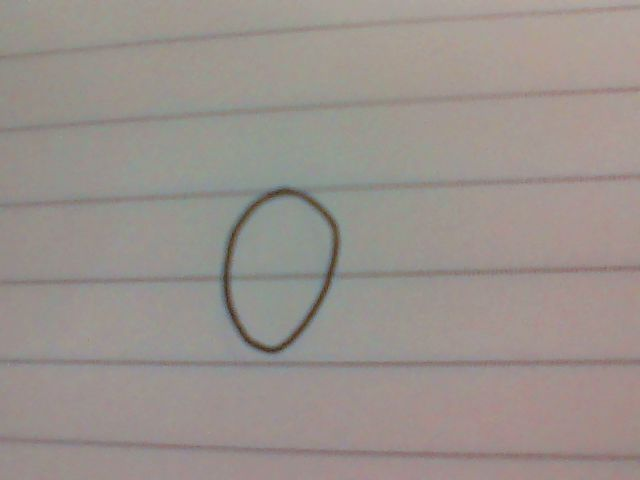

Ảnh sau khi tiền xử lý


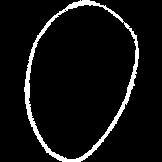

Ảnh đã resize về 8x8


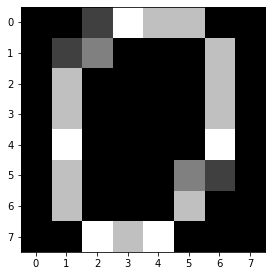

predict :  [5]
Ảnh gốc


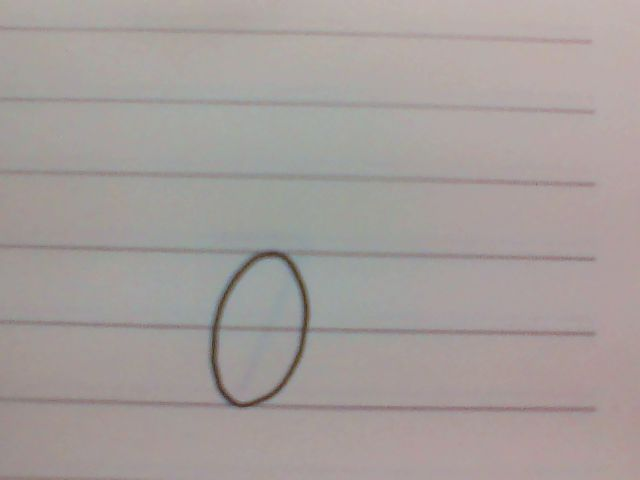

Ảnh sau khi tiền xử lý


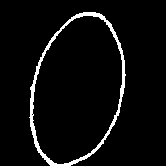

Ảnh đã resize về 8x8


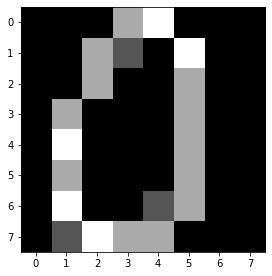

predict :  [9]
Ảnh gốc


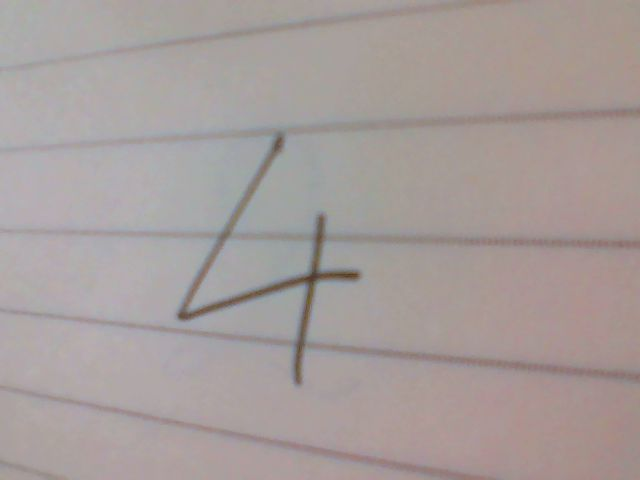

Ảnh sau khi tiền xử lý


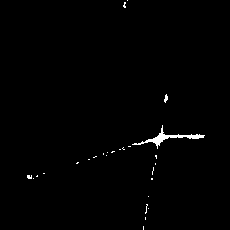

Ảnh đã resize về 8x8


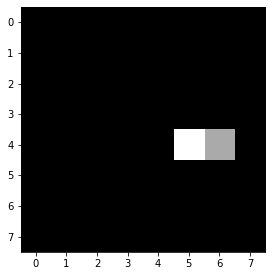

predict :  [9]
Ảnh gốc


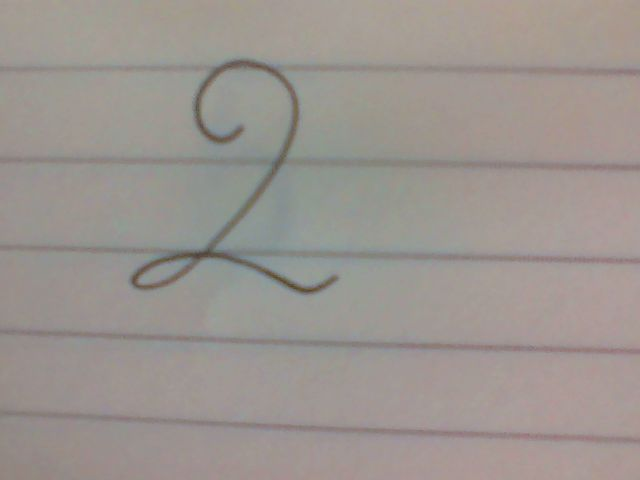

Ảnh sau khi tiền xử lý


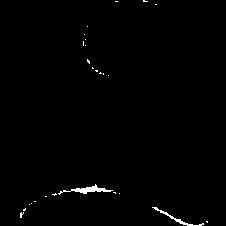

Ảnh đã resize về 8x8


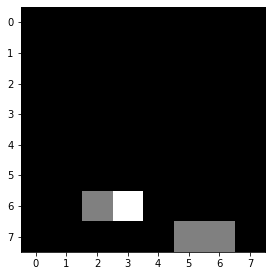

predict :  [9]
Ảnh gốc


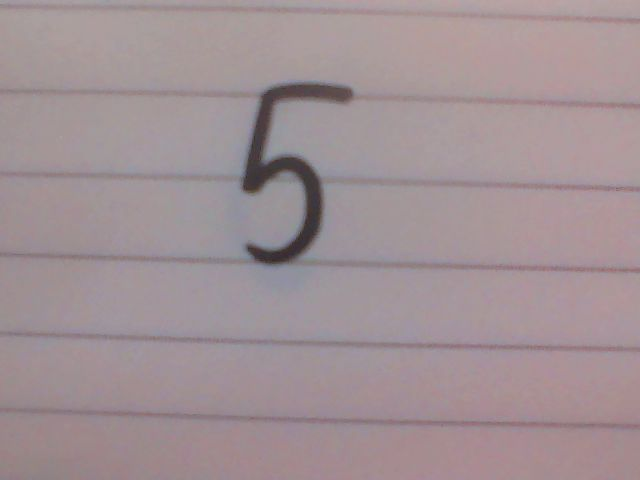

Ảnh sau khi tiền xử lý


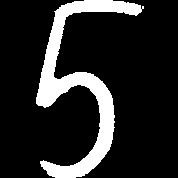

Ảnh đã resize về 8x8


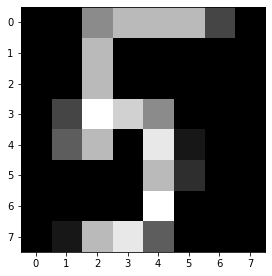

predict :  [5]
Ảnh gốc


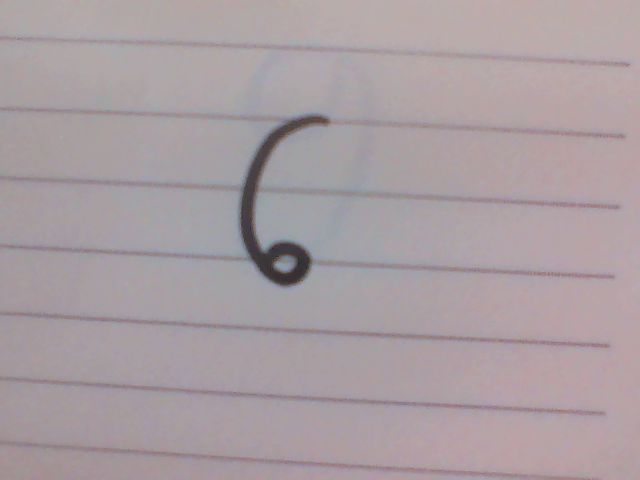

Ảnh sau khi tiền xử lý


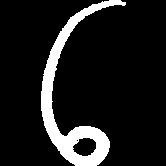

Ảnh đã resize về 8x8


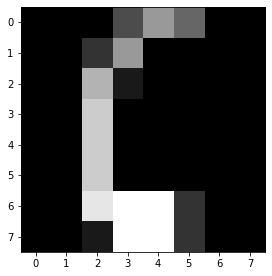

predict :  [5]
Ảnh gốc


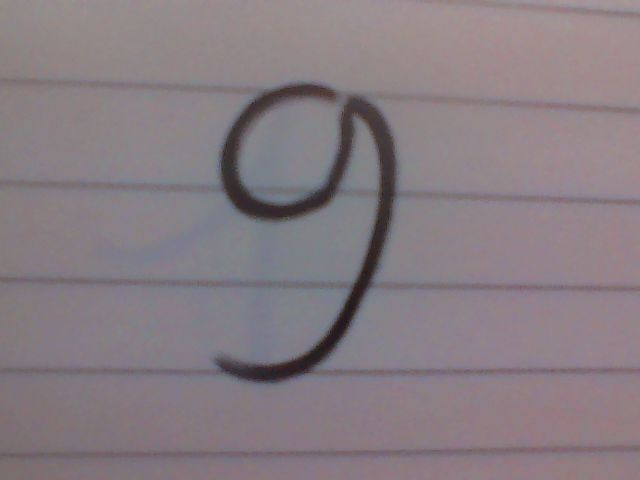

Ảnh sau khi tiền xử lý


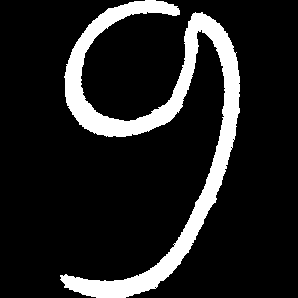

Ảnh đã resize về 8x8


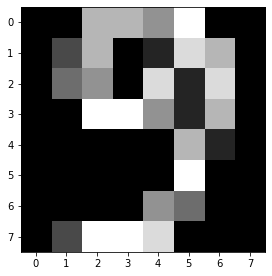

predict :  [5]
Ảnh gốc


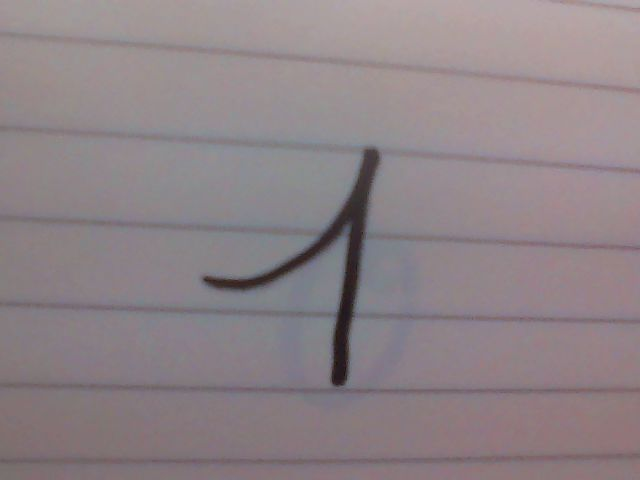

Ảnh sau khi tiền xử lý


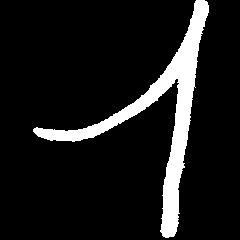

Ảnh đã resize về 8x8


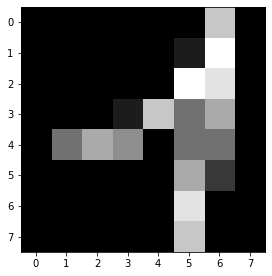

predict :  [9]
Ảnh gốc


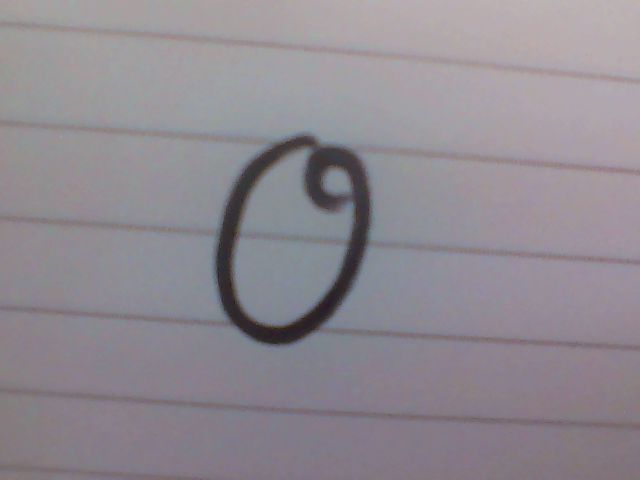

Ảnh sau khi tiền xử lý


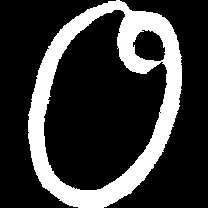

Ảnh đã resize về 8x8


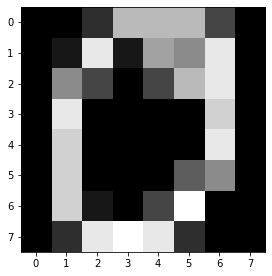

predict :  [3]
Ảnh gốc


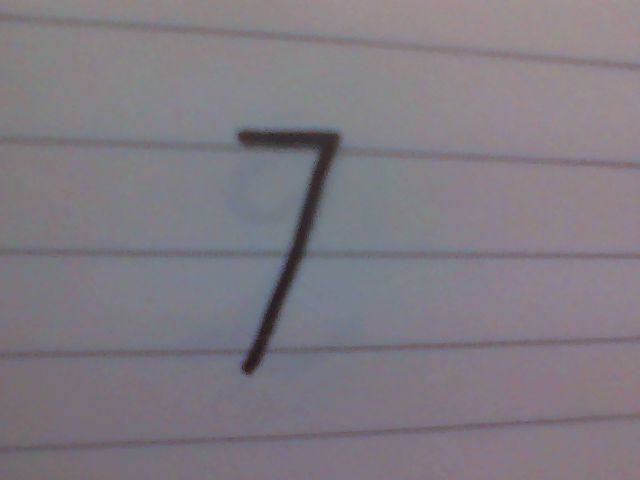

Ảnh sau khi tiền xử lý


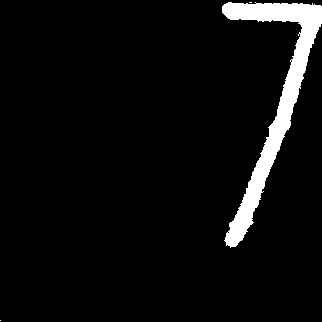

Ảnh đã resize về 8x8


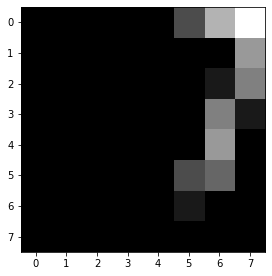

predict :  [7]
Ảnh gốc


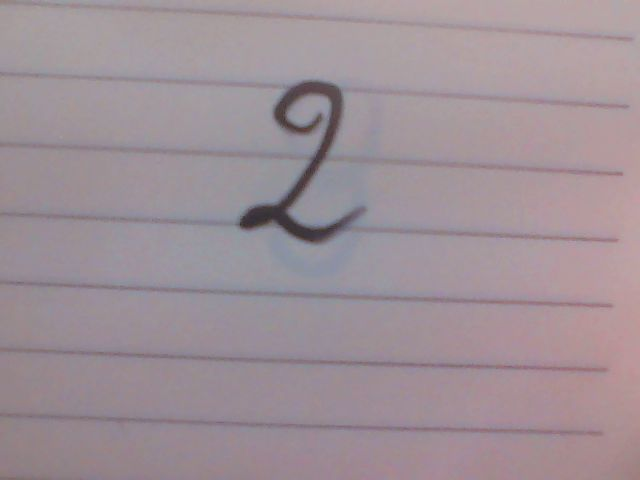

Ảnh sau khi tiền xử lý


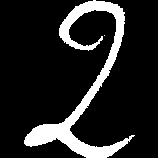

Ảnh đã resize về 8x8


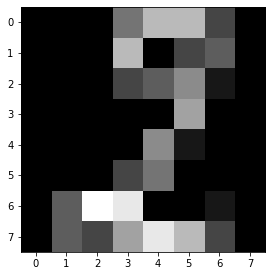

predict :  [2]
Ảnh gốc


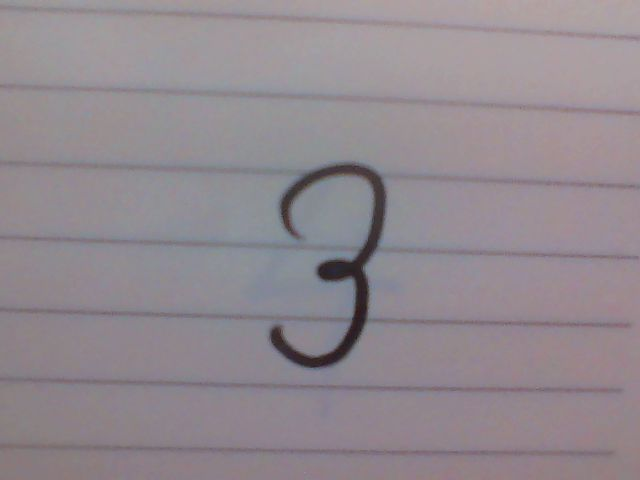

Ảnh sau khi tiền xử lý


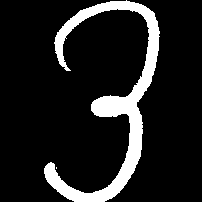

Ảnh đã resize về 8x8


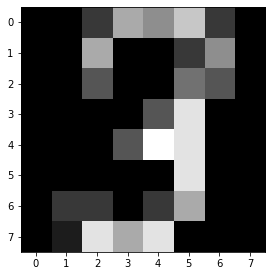

predict :  [3]
Ảnh gốc


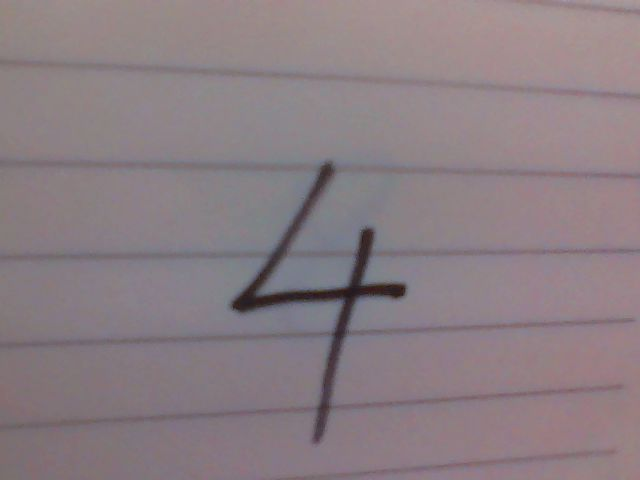

Ảnh sau khi tiền xử lý


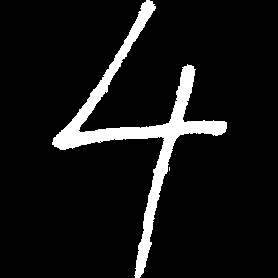

Ảnh đã resize về 8x8


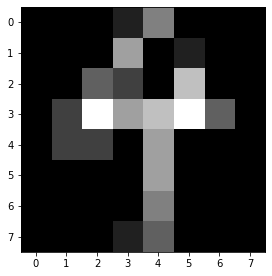

predict :  [9]
Ảnh gốc


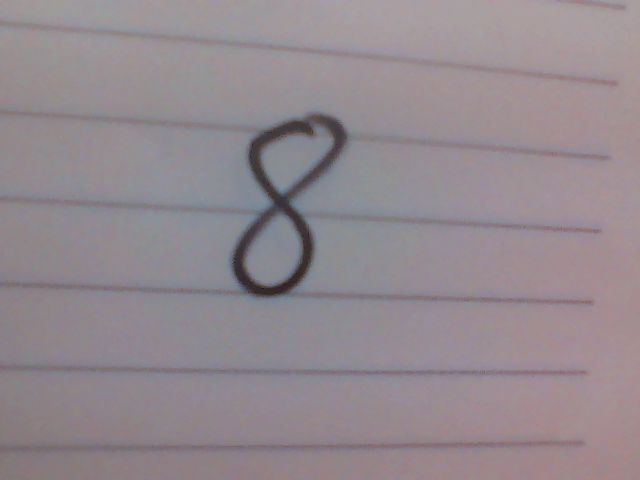

Ảnh sau khi tiền xử lý


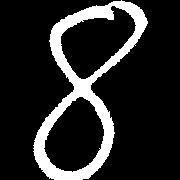

Ảnh đã resize về 8x8


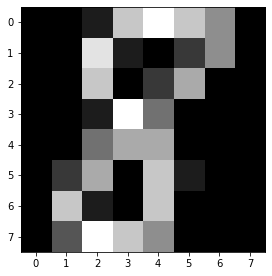

predict :  [8]
Ảnh gốc


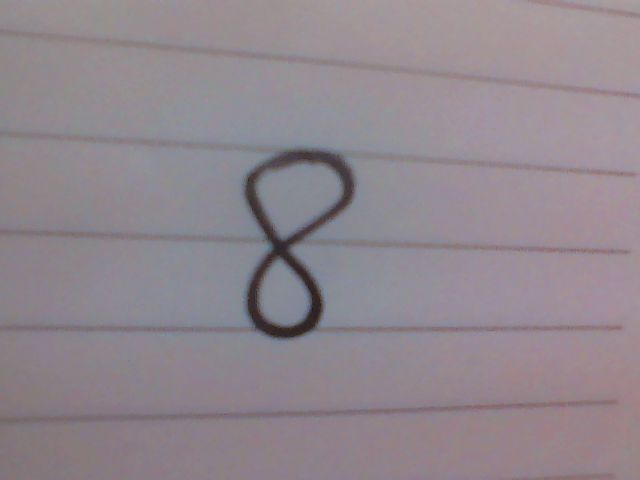

Ảnh sau khi tiền xử lý


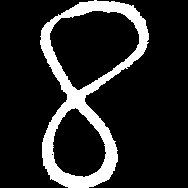

Ảnh đã resize về 8x8


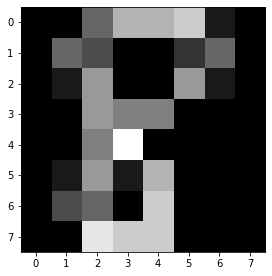

predict :  [8]
Ảnh gốc


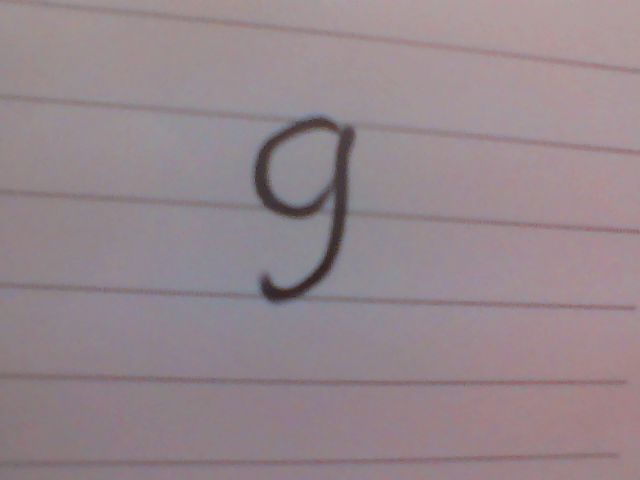

Ảnh sau khi tiền xử lý


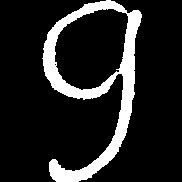

Ảnh đã resize về 8x8


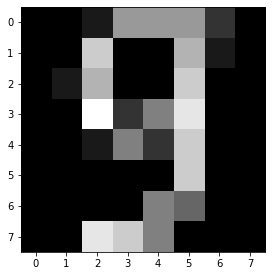

predict :  [9]
Ảnh gốc


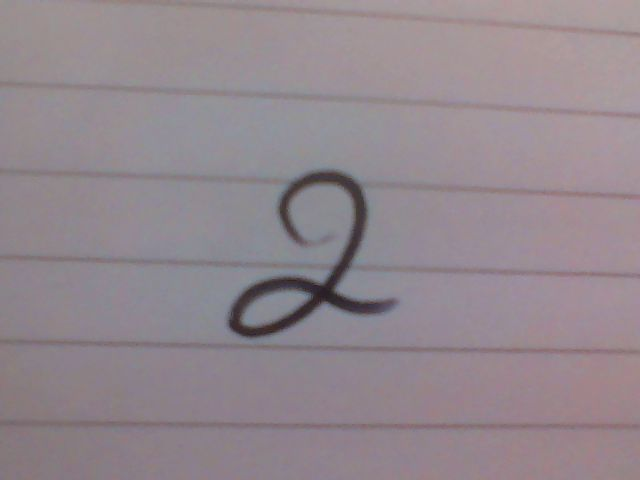

Ảnh sau khi tiền xử lý


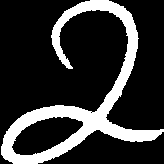

Ảnh đã resize về 8x8


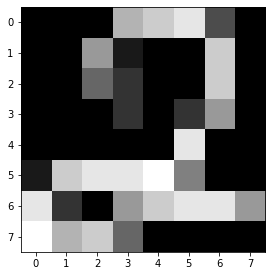

predict :  [7]
Ảnh gốc


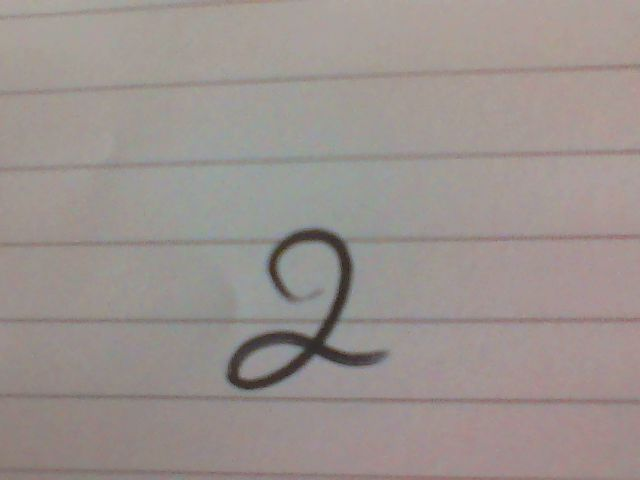

Ảnh sau khi tiền xử lý


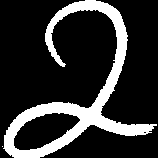

Ảnh đã resize về 8x8


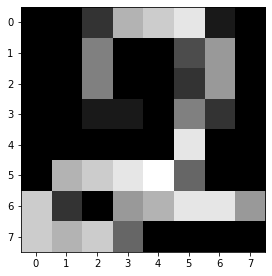

predict :  [7]
Ảnh gốc


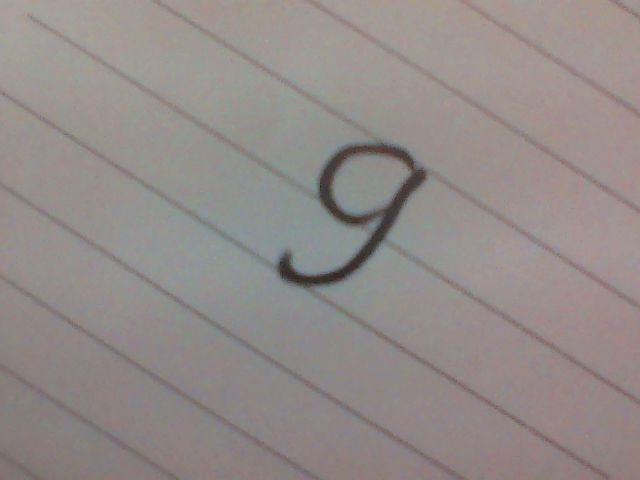

Ảnh sau khi tiền xử lý


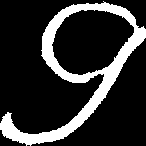

Ảnh đã resize về 8x8


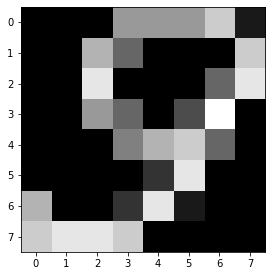

predict :  [5]
Ảnh gốc


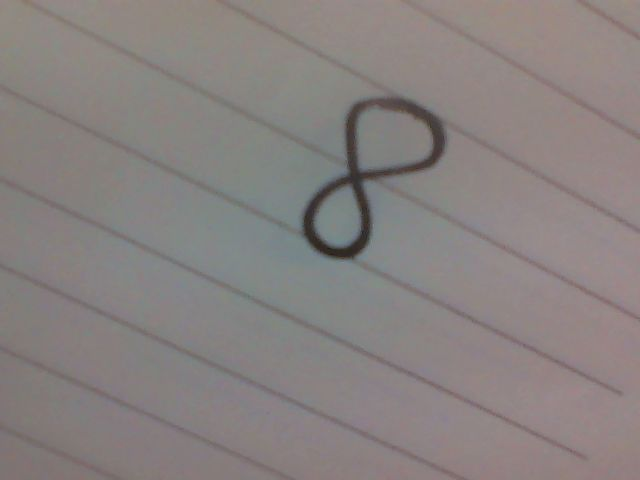

Ảnh sau khi tiền xử lý


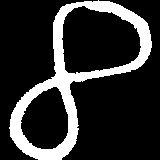

Ảnh đã resize về 8x8


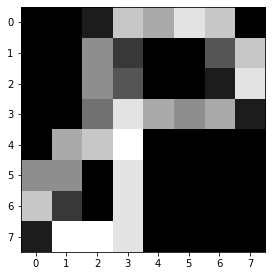

predict :  [5]
Ảnh gốc


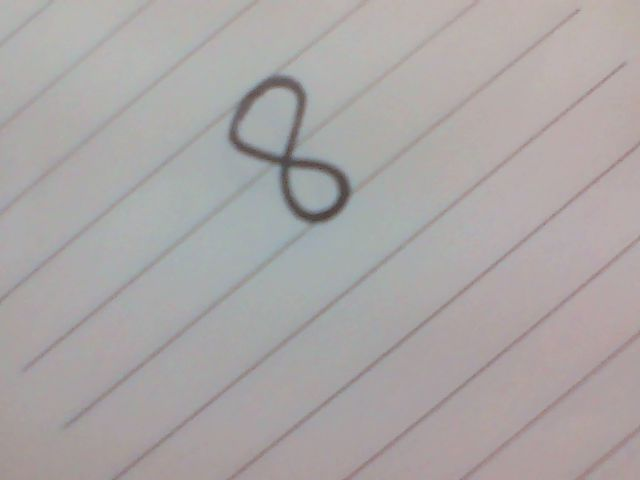

Ảnh sau khi tiền xử lý


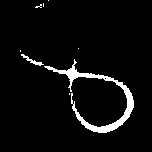

Ảnh đã resize về 8x8


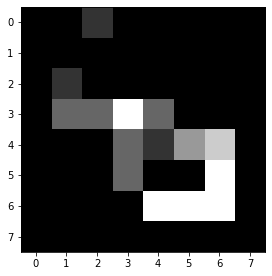

predict :  [9]
Ảnh gốc


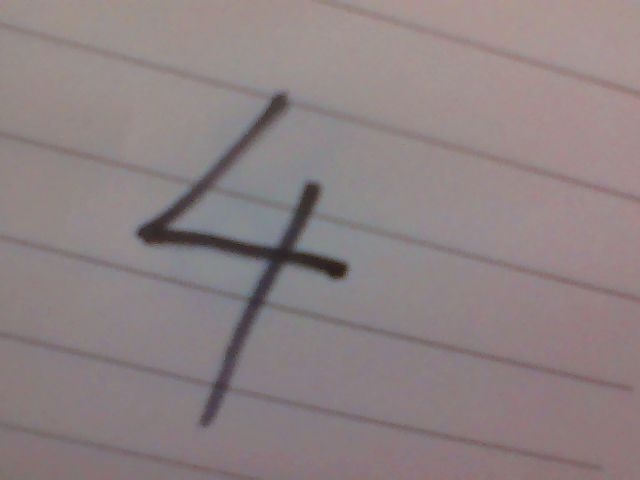

Ảnh sau khi tiền xử lý


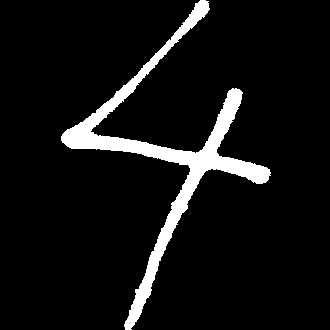

Ảnh đã resize về 8x8


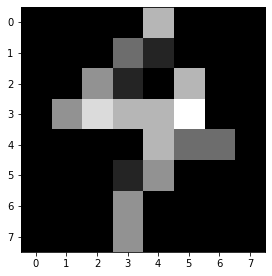

predict :  [9]
Ảnh gốc


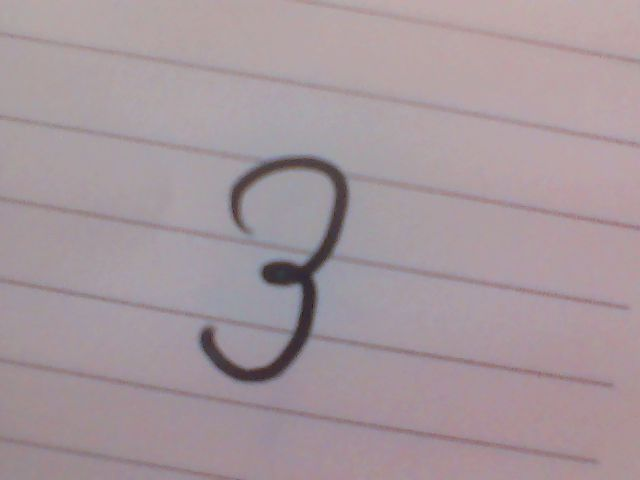

Ảnh sau khi tiền xử lý


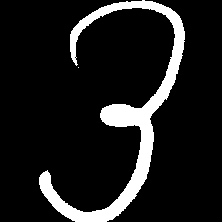

Ảnh đã resize về 8x8


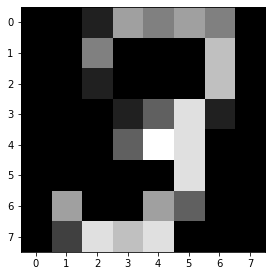

predict :  [3]
Ảnh gốc


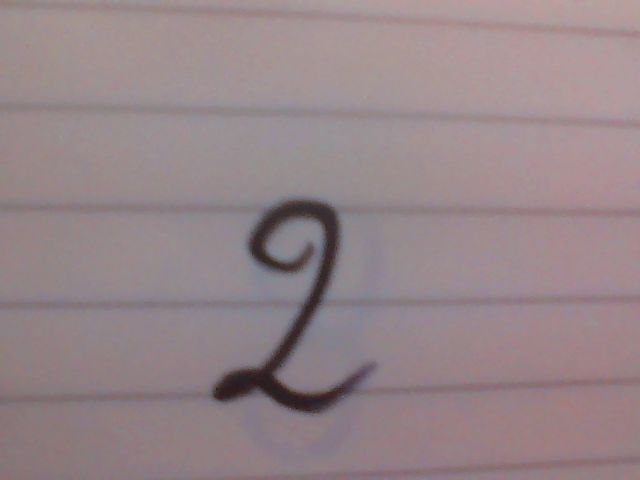

Ảnh sau khi tiền xử lý


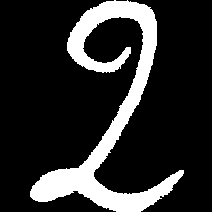

Ảnh đã resize về 8x8


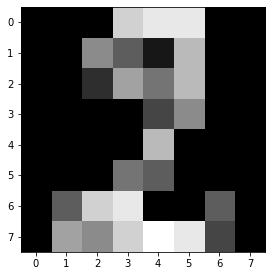

predict :  [2]
Ảnh gốc


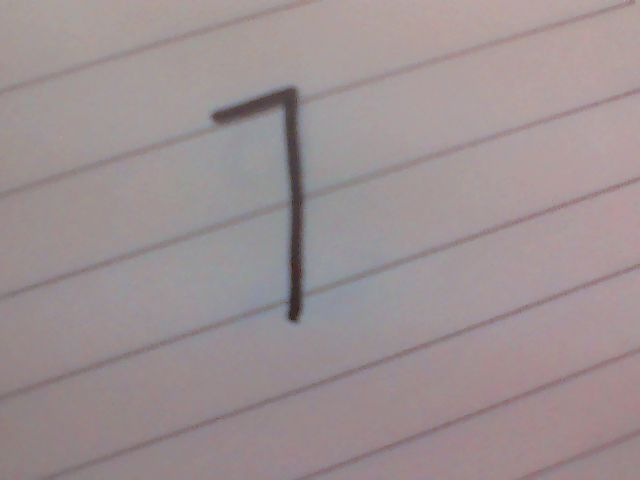

Ảnh sau khi tiền xử lý


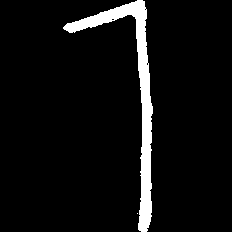

Ảnh đã resize về 8x8


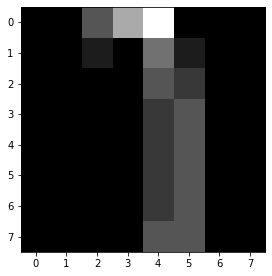

predict :  [3]


In [ ]:
predicted = []
for i in range(50):
  image = PreprocessingImage(cv2.imread(os.path.join(path_dataset,list_fn[i]),0))
  
  strictedImg_resized = image // 16
  strictedImg_resized = cv2.resize( strictedImg_resized,( 8,8 ),interpolation = cv2.INTER_AREA)

  _result1 = clf.predict(strictedImg_resized.reshape((1,64)))

  print('Ảnh gốc')
  cv2_imshow(cv2.imread(os.path.join(path_dataset,list_fn[i])))

  print('Ảnh sau khi tiền xử lý')
  cv2_imshow(image)

  print('Ảnh đã resize về 8x8')
  plt.figure(figsize=(12,4.5))
  plt.imshow(strictedImg_resized, cmap = 'gray', interpolation='nearest')
  plt.show()

  print('predict : ',_result1)
  predicted.append(*_result1)

**Độ chính xác của dữ liệu**

In [ ]:
accuracy_score(labels,predicted)

0.46

# Answer question

Trả lời câu hỏi:

**Kết quả chạy thực nghiệm bằng webcam của laptop và giấy viết tay của các bạn có tốt hay không?**
- Kết quả chạy thực nghiệm bằng webcam của laptop và giấy viết tay của chúng em không tốt và chỉ đạt độ chính xác cỡ 40% đến 50%.

**Ủa mà nhìn vào đâu để kết luận là tốt hay không?**
- Để xác định có tốt hay không thì chúng em đã tạo một file chứa các hình của các mẫu giấy có chứa chữ viết tay của bọn em và nhãn ứng với các hình đó trên google drive. Sau đó chúng em sử dụng các hình đó để làm bộ test và so sánh kết quả predict của model với nhãn đã lưu sẵn trong file và tính tỉ lệ predict đúng theo như code trình bày ở trên và chỉ đạt được độ chính xác là 0.46.

**Nếu không tốt thì lý do tại sao?**
- Do chữ viết tay của chúng em khác với chữ viết tay trong dataset của skilearn
- Do độ phân giải webcam của chúng em khác với độ phân giải của webcam của người cung cấp dataset của skilearn
- Do ánh sáng khác nhau
- Do sử dụng loại giấy khác nhau
- Chữ viết nghiêng phân loại không đúng
- Do kỹ thuật tiền xử lý ảnh của chúng em chưa tốt bằng những người làm ra thư viện

**Nếu tốt thì tiếp theo có thể dùng model digits recognition này vào các bài toán phức tạp hơn như nhận dạng biển số nhà không?**
- Theo chúng em thì không thể vì các biển số nhà có nhiều màu khác nhau và mỗi vùng lại sử dụng kiểu biển khác nhau: biển nhựa, biển sắt,...
- Biển số nhà không chỉ chứa mỗi một số mà chứa rất nhiều số thậm chí cả chữ cái cũng như các dấu '/' và tên đường, tên phường, tên quận






# Tham khảo

Folder ảnh: https://drive.google.com/drive/u/1/folders/1Q5iE--fdPPzTenfNKVrglsB2tDCgWnVv

Add webcam: https://colab.research.google.com/notebooks/snippets/advanced_outputs.ipynb#scrollTo=7EDBBkAz2USP

Preprocessing: https://github.com/phutaekwondo/CS114.L21/blob/main/BT_Colab_so_1/bt01_colab.ipynb
